# 1 Population Selection

The prepared dataset spectra from every population and instrument is now to be analysed to ensure there are no issues for a given populations.

This is a general screen to determine:
- there was no issue with the data collection, i.e. reference values correspond to correct spectra samples
- a population isn't widely different to the majority of populations, i.e. overripe or refrigerated fruit. (TODO)

## Setup

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.decomposition import PCA
from sklearn.model_selection import cross_validate
from sklearn.cross_decomposition import PLSRegression
from scipy.signal import savgol_filter

In [2]:
# read in prepared dataset from previous step
df = pd.read_pickle("../1_prepare_dataset/data/prepared/mango_dmc_and_spectra_v2.pkl")
wavelength_cols = df.filter(regex="^\d+", axis=1).columns.tolist()
descriptive_cols = [col for col in df.columns if col not in wavelength_cols]
df

,origin,population,date,season,region,cultivar,physio_stage,temp,reference_no,dry_matter,...,1173,1176,1179,1182,1185,1188,1191,1194,1197,1200
0,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,nich,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93933,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10676,22.502700,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93934,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10677,22.888390,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93935,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10678,22.975740,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
93936,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10679,23.211150,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
# get unique combinations of populations and instruments
categories = (
    df.groupby(["season", "population", "instrument"])
    .size()
    .reset_index()
    .rename(columns={0: "n"})
)
original_pops = (
    df.groupby(["origin", "population", "instrument"])
    .size()
    .reset_index()
    .rename(columns={0: "n"})
    .query("origin == 'published'")
    [["population", "instrument"]]
)
original_pops["published"] = 1
categories = categories.merge(right=original_pops, how="left")
categories["published"] = categories["published"].fillna(0).astype(int)
categories

,season,population,instrument,n,published
0,2015,100100,15006,160,1
1,2015,100100,15014,160,0
2,2015,100100,15016,160,0
3,2015,100100,15023,160,0
4,2015,100100,15026,160,0
...,...,...,...,...,...
868,2021,122300,15014,80,0
869,2021,122400,15029,80,0
870,2021,122400,16041,80,0
871,2021,200700,18007,172,0


## Remove Categories

In [4]:
# select categories with greater than x spectra samples
categories = categories.query("n >= 10 or published == 1").copy()

# remove F751 units
categories = categories[~categories["instrument"].astype(str).str.startswith("19")].copy()

## Apply basic pretreatment

Use pretreatment and wavelength range optimised for mango dmc application by Anderson 2020.

In [5]:
# apply Savitzky-Golay smoothing to the spectra
df_p = df.copy()
df_p[wavelength_cols] = df_p[wavelength_cols].apply(
    lambda row: savgol_filter(
        x=row,
        window_length=17,
        polyorder=2,
        deriv=2
    ),
    axis=1,
    result_type="expand"
)

# select wavelengths
selected_wavelengths = list(filter(lambda w: 684 <= int(w) <= 990, wavelength_cols))
df_p = df_p[
    descriptive_cols
    + selected_wavelengths
]

df_p

,origin,population,date,season,region,cultivar,physio_stage,temp,reference_no,dry_matter,...,963,966,969,972,975,978,981,984,987,990
0,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,-0.002284,-0.002370,-0.002319,-0.002167,-0.001931,-0.001664,-0.001437,-0.001224,-0.001095,-0.001008
1,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,-0.002294,-0.002360,-0.002297,-0.002137,-0.001910,-0.001666,-0.001444,-0.001268,-0.001123,-0.001012
2,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,-0.002539,-0.002598,-0.002525,-0.002361,-0.002106,-0.001810,-0.001529,-0.001289,-0.001107,-0.000965
3,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,-0.002556,-0.002625,-0.002556,-0.002374,-0.002111,-0.001816,-0.001539,-0.001298,-0.001104,-0.000962
4,nich,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,-0.002234,-0.002321,-0.002273,-0.002123,-0.001911,-0.001658,-0.001430,-0.001228,-0.001079,-0.000973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93933,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10676,22.502700,...,-0.001942,-0.002023,-0.002006,-0.001882,-0.001695,-0.001485,-0.001276,-0.001108,-0.000975,-0.000870
93934,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10677,22.888390,...,-0.001918,-0.002001,-0.001977,-0.001857,-0.001673,-0.001459,-0.001253,-0.001081,-0.000956,-0.000862
93935,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10678,22.975740,...,-0.001908,-0.002009,-0.001995,-0.001893,-0.001723,-0.001529,-0.001336,-0.001169,-0.001036,-0.000922
93936,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10679,23.211150,...,-0.002194,-0.002312,-0.002301,-0.002184,-0.001977,-0.001731,-0.001494,-0.001303,-0.001150,-0.001023


## Fit PLS per category (population + instrument)

In [6]:
# loop through each category
category_metrics = []
for index, category in categories.iterrows():

    # get spectra samples for category
    samples = df_p.query(
        f"population == {category['population']} and instrument == {category['instrument']}"
    ).copy()

    # create PLS models with 11 LVs
    pls = PLSRegression(n_components=11, scale=False)

    # cross validate model 10 fold on category samples
    folds = 10
    scores = cross_validate(
        estimator=pls,
        X=samples[selected_wavelengths],
        y=samples["dry_matter"],
        cv=folds,
        scoring=("r2", "neg_root_mean_squared_error"),
        return_train_score=True,
        error_score="raise"
    )

    # save metrics
    category_metrics.append({
        "population": category["population"],
        "instrument": category["instrument"],
        "published": category["published"],
        "n_samples": category["n"],
        "dm_mean": samples["dry_matter"].mean(),
        "dm_std_dev": samples["dry_matter"].std(),
        "cv_folds": folds,
        "test_rmse_cv": -scores["test_neg_root_mean_squared_error"].mean(),
        "test_r2_cv": scores["train_r2"].mean(),
        "train_rmse_cv": -scores["train_neg_root_mean_squared_error"].mean(),
        "train_r2_cv": scores["train_r2"].mean(),
    })

c:\Users\12196478\Git\github.com\jemjemwalsh\research-dl-nirs\venv\lib\site-packages\sklearn\cross_decomposition\_pls.py:305: UserWarning: Y residual is constant at iteration 8
  warnings.warn(f"Y residual is constant at iteration {k}")
c:\Users\12196478\Git\github.com\jemjemwalsh\research-dl-nirs\venv\lib\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
c:\Users\12196478\Git\github.com\jemjemwalsh\research-dl-nirs\venv\lib\site-packages\sklearn\cross_decomposition\_pls.py:305: UserWarning: Y residual is constant at iteration 9
  warnings.warn(f"Y residual is constant at iteration {k}")
c:\Users\12196478\Git\github.com\jemjemwalsh\research-dl-nirs\venv\lib\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
c:\Users\12196478\Git\github.c

In [7]:
category_metrics = pd.DataFrame(category_metrics)
category_metrics

,population,instrument,published,n_samples,dm_mean,dm_std_dev,cv_folds,test_rmse_cv,test_r2_cv,train_rmse_cv,train_r2_cv
0,100100,15006,1,160,16.012674,1.840255,10,0.562510,0.965991,0.334412,0.965991
1,100100,15014,0,160,16.012674,1.840255,10,0.557702,0.967216,0.328379,0.967216
2,100100,15016,0,160,16.012674,1.840255,10,0.559161,0.957028,0.375985,0.957028
3,100100,15023,0,160,16.012674,1.840255,10,2.044473,0.579920,1.169372,0.579920
4,100100,15026,0,160,16.012674,1.840255,10,2.119004,0.439411,1.354939,0.439411
...,...,...,...,...,...,...,...,...,...,...,...
823,122300,15014,0,80,11.668954,0.740608,10,0.556425,0.853115,0.277520,0.853115
824,122400,15029,0,80,15.881583,1.731371,10,0.651256,0.960267,0.327004,0.960267
825,122400,16041,0,80,15.881583,1.731371,10,0.699756,0.944704,0.383816,0.944704
826,200700,18007,0,172,16.694430,2.284506,10,0.901506,0.895324,0.723803,0.895324


In [8]:
category_metrics["n_samples"].sum()

88026

## Select Categories

Only want categories where the PLS was able to make a reasonable prediction. A bad RMSEVCV indicates something may be wrong with the population.

In [9]:
# filter categories based on cross-validated test metrics
selected_categories = category_metrics.query("""test_rmse_cv < 1.1 or published == 1""")
selected_categories

,population,instrument,published,n_samples,dm_mean,dm_std_dev,cv_folds,test_rmse_cv,test_r2_cv,train_rmse_cv,train_r2_cv
0,100100,15006,1,160,16.012674,1.840255,10,0.562510,0.965991,0.334412,0.965991
1,100100,15014,0,160,16.012674,1.840255,10,0.557702,0.967216,0.328379,0.967216
2,100100,15016,0,160,16.012674,1.840255,10,0.559161,0.957028,0.375985,0.957028
7,100200,15006,1,80,13.557441,1.401365,10,0.761445,0.931115,0.358042,0.931115
8,100200,15014,0,160,13.557441,1.396951,10,0.596543,0.887134,0.457619,0.887134
...,...,...,...,...,...,...,...,...,...,...,...
823,122300,15014,0,80,11.668954,0.740608,10,0.556425,0.853115,0.277520,0.853115
824,122400,15029,0,80,15.881583,1.731371,10,0.651256,0.960267,0.327004,0.960267
825,122400,16041,0,80,15.881583,1.731371,10,0.699756,0.944704,0.383816,0.944704
826,200700,18007,0,172,16.694430,2.284506,10,0.901506,0.895324,0.723803,0.895324


In [10]:
selected_categories["n_samples"].sum()

85401

## Get samples for selected categories

In [11]:
selected_category_samples = df.merge(
    right=selected_categories[["population", "instrument"]],
    how="inner"
)
selected_category_samples

,origin,population,date,season,region,cultivar,physio_stage,temp,reference_no,dry_matter,...,1173,1176,1179,1182,1185,1188,1191,1194,1197,1200
0,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,published,100100,2015-09-27,2015,NT,caly,green,high,2,12.430130,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85396,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10676,22.502700,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
85397,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10677,22.888390,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
85398,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10678,22.975740,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
85399,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10679,23.211150,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
selected_category_samples_pretreated = df_p.merge(
    right=selected_categories[["population", "instrument"]],
    how="inner"
)

In [13]:
# have a look at the removed samples
removed_samples = df[~df["spectra_no"].isin(selected_category_samples["spectra_no"])]
removed_samples

,origin,population,date,season,region,cultivar,physio_stage,temp,reference_no,dry_matter,...,1173,1176,1179,1182,1185,1188,1191,1194,1197,1200
12,nich,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13,nich,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14,nich,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15,nich,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
16,nich,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91826,nich,122000,2021-09-09,2021,NT,kp,ripen,undef,8998,18.632120,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
91828,nich,122000,2021-09-09,2021,NT,kp,ripen,undef,8999,18.706928,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
91830,nich,122000,2021-09-09,2021,NT,kp,ripen,undef,9000,18.775870,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
91832,nich,122000,2021-09-09,2021,NT,kp,ripen,undef,9001,19.413657,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
# look at the removed categories
len(removed_samples.groupby(["population"]).size())

37

## PCA Plot per X

In [15]:
# Perform PCA
pca = PCA()
principal_components = pca.fit_transform(selected_category_samples_pretreated[selected_wavelengths])

# select the number of PCs explaining at least 1% variance
var_explained = pca.explained_variance_ratio_
n_comp = len(var_explained[var_explained > 0.01])

# create a DataFrame with principal component scores
pc_scores = pd.DataFrame(principal_components[:, :n_comp])
pc_scores.columns = [f"PC{i + 1}" for i in range(n_comp)]

# add metta data back in
pc_scores["spectra_no"] = selected_category_samples["spectra_no"]
pc_scores = selected_category_samples[descriptive_cols].merge(pc_scores, on="spectra_no")
pc_scores

,origin,population,date,season,region,cultivar,physio_stage,temp,reference_no,dry_matter,instrument,spectra_no,PC1,PC2,PC3
0,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,15006,1,-0.008925,0.001044,-0.000294
1,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,15006,2,-0.009116,0.000917,-0.000410
2,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,15006,3,-0.009879,0.000848,-0.001176
3,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,15006,4,-0.010059,0.000741,-0.001278
4,published,100100,2015-09-27,2015,NT,caly,green,high,2,12.430130,15006,29,-0.008818,0.006048,0.000197
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85396,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10676,22.502700,18007,93934,0.005253,-0.003602,-0.001216
85397,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10677,22.888390,18007,93935,0.002517,-0.006282,-0.000037
85398,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10678,22.975740,18007,93936,-0.002330,-0.003681,-0.001002
85399,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10679,23.211150,18007,93937,0.006068,-0.004039,-0.001425


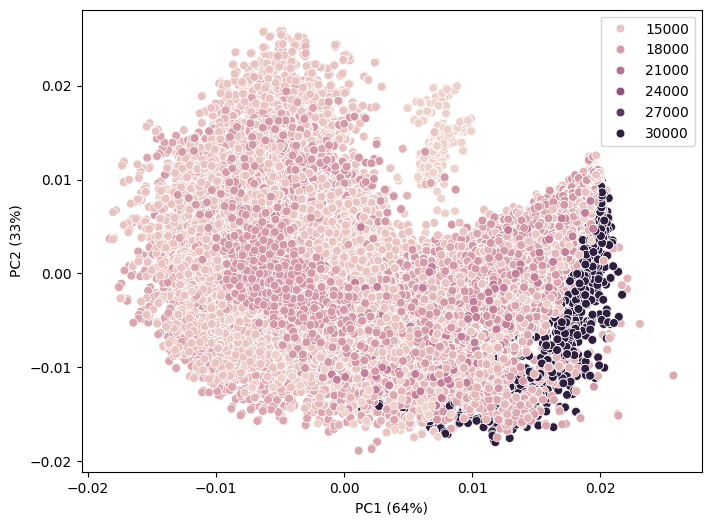

In [16]:
# plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=pc_scores["PC1"], y=pc_scores["PC2"], hue=pc_scores["instrument"], s=40)
plt.xlabel(f"PC1 ({round(var_explained[0] * 100)}%)")
plt.ylabel(f"PC2 ({round(var_explained[1] * 100)}%)")
plt.legend()
plt.show()

In [17]:
# interactive plot
fig = px.scatter(
    data_frame=pc_scores,
    x="PC1",
    y="PC2",
    color="instrument",
    symbol="population",
    size_max=20,
    labels={
        "PC1": f"PC1 ({round(var_explained[0] * 100)}%)",
        "PC2": f"PC2 ({round(var_explained[1] * 100)}%)"
    },
    title="Interactive Scatter Plot",
    hover_data=["instrument", "population"]
)
fig.update_layout(height=800)

# Show the plot
fig.show()

## Output data

In [18]:
# output
# selected_category_samples.to_csv("data/interim/1_selected_pops.csv", index=False)
selected_category_samples.to_pickle("data/interim/1_selected_pops.pkl")

In [24]:
print("Populations:", len(selected_category_samples.groupby(["population"]).size()))
print("Instruments:", len(selected_category_samples.groupby(["instrument"]).size()))
selected_category_samples

Populations: 199
Instruments: 31


,origin,population,date,season,region,cultivar,physio_stage,temp,reference_no,dry_matter,...,1173,1176,1179,1182,1185,1188,1191,1194,1197,1200
0,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,published,100100,2015-09-27,2015,NT,caly,green,high,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,published,100100,2015-09-27,2015,NT,caly,green,low,1,12.402643,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,published,100100,2015-09-27,2015,NT,caly,green,high,2,12.430130,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85396,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10676,22.502700,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
85397,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10677,22.888390,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
85398,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10678,22.975740,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
85399,marcelo,200800,NaT,2021,QLD,keitt,green,undef,10679,23.211150,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
